In [1]:
import numpy as np
import pandas as pd 
import os

geo = pd.read_csv("datasets/olist_geolocation_dataset.csv", dtype={'geolocation_zip_code_prefix': str})

# Gets the first three and four first digits of zip codes, we will explore this further to understand how zip codes works
geo['geolocation_zip_code_prefix_1_digits'] = geo['geolocation_zip_code_prefix'].str[0:1]
geo['geolocation_zip_code_prefix_2_digits'] = geo['geolocation_zip_code_prefix'].str[0:2]
geo['geolocation_zip_code_prefix_3_digits'] = geo['geolocation_zip_code_prefix'].str[0:3]
geo['geolocation_zip_code_prefix_4_digits'] = geo['geolocation_zip_code_prefix'].str[0:4]
geo.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,geolocation_zip_code_prefix_4_digits
0,01037,-23.545621,-46.639292,sao paulo,SP,0,01,010,0103
1,01046,-23.546081,-46.644820,sao paulo,SP,0,01,010,0104
2,01046,-23.546129,-46.642951,sao paulo,SP,0,01,010,0104


In [2]:
#importing libraries
import datashader

In [3]:
#checking the datatypes for each feature
geo.dtypes

geolocation_zip_code_prefix              object
geolocation_lat                         float64
geolocation_lng                         float64
geolocation_city                         object
geolocation_state                        object
geolocation_zip_code_prefix_1_digits     object
geolocation_zip_code_prefix_2_digits     object
geolocation_zip_code_prefix_3_digits     object
geolocation_zip_code_prefix_4_digits     object
dtype: object

In [4]:
geo['geolocation_zip_code_prefix'].value_counts().to_frame().describe()

,geolocation_zip_code_prefix
count,19015.000000
mean,52.598633
std,72.057907
min,1.000000
25%,10.000000
50%,29.000000
75%,66.500000
max,1146.000000


In [5]:
geo.describe()

,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06
mean,-2.117615e+01,-4.639054e+01
std,5.715866e+00,4.269748e+00
min,-3.660537e+01,-1.014668e+02
25%,-2.360355e+01,-4.857317e+01
50%,-2.291938e+01,-4.663788e+01
75%,-1.997962e+01,-4.376771e+01
max,4.506593e+01,1.211054e+02


In [6]:
#ensurin all coordinates are within brazil territory
# Removing some outliers

#Brazils most Northern spot is at 5 deg 16′ 27.8″ N latitude.;
geo = geo[geo.geolocation_lat <= 5.27438888]
#it’s most Western spot is at 73 deg, 58′ 58.19″W Long.
geo = geo[geo.geolocation_lng >= -73.98283055]
#It’s most southern spot is at 33 deg, 45′ 04.21″ S Latitude.
geo = geo[geo.geolocation_lat >= -33.75116944]
#It’s most Eastern spot is 34 deg, 47′ 35.33″ W Long.
geo = geo[geo.geolocation_lng <=  -34.79314722]

In [7]:
#transforming the lat and long coordinates to Mercator x/y Coordinates.
from datashader.utils import lnglat_to_meters as webm
x, y = webm(geo.geolocation_lng, geo.geolocation_lat)
geo['x'] = pd.Series(x)
geo['y'] = pd.Series(y)

In [8]:
geo.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,geolocation_zip_code_prefix_4_digits,x,y
0,01037,-23.545621,-46.639292,sao paulo,SP,0,01,010,0103,-5.191862e+06,-2.698137e+06
1,01046,-23.546081,-46.644820,sao paulo,SP,0,01,010,0104,-5.192478e+06,-2.698193e+06
2,01046,-23.546129,-46.642951,sao paulo,SP,0,01,010,0104,-5.192270e+06,-2.698199e+06


In [9]:
geo.dtypes

geolocation_zip_code_prefix              object
geolocation_lat                         float64
geolocation_lng                         float64
geolocation_city                         object
geolocation_state                        object
geolocation_zip_code_prefix_1_digits     object
geolocation_zip_code_prefix_2_digits     object
geolocation_zip_code_prefix_3_digits     object
geolocation_zip_code_prefix_4_digits     object
x                                       float64
y                                       float64
dtype: object

## Plotting the coordinates on a map. We see there is a relationship between the zip code prefix and the location of that zip code. They start in Sao Paulo, with prefix 01001, and then increase counterclockwise finishing in Rio Grande do Sul (south of Brazil), with prefix 99990.

In [10]:
# transforming the prefixes to int for plotting purposes
geo['geolocation_zip_code_prefix'] = geo['geolocation_zip_code_prefix'].astype(int)
geo['geolocation_zip_code_prefix_1_digits'] = geo['geolocation_zip_code_prefix_1_digits'].astype(int)
geo['geolocation_zip_code_prefix_2_digits'] = geo['geolocation_zip_code_prefix_2_digits'].astype(int)
geo['geolocation_zip_code_prefix_3_digits'] = geo['geolocation_zip_code_prefix_3_digits'].astype(int)
geo['geolocation_zip_code_prefix_4_digits'] = geo['geolocation_zip_code_prefix_4_digits'].astype(int)

In [11]:
brazil = geo
agg_name = 'geolocation_zip_code_prefix'
brazil[agg_name].describe().to_frame()

,geolocation_zip_code_prefix
count,1.000121e+06
mean,3.657332e+04
std,3.054939e+04
min,1.001000e+03
25%,1.107500e+04
50%,2.653000e+04
75%,6.350400e+04
max,9.999000e+04


In [33]:
#viewing the unique states
geo['geolocation_state'].unique()

array(['SP', 'RN', 'AC', 'RJ', 'ES', 'MG', 'BA', 'SE', 'PE', 'AL', 'PB',
       'CE', 'PI', 'MA', 'PA', 'AP', 'AM', 'RR', 'DF', 'GO', 'RO', 'TO',
       'MT', 'MS', 'RS', 'PR', 'SC'], dtype=object)

In [42]:
#viewing the unique cities
geo['geolocation_city'].unique()[20:]

array(['vargem grande paulista', 'embu das artes', 'itapecerica da serra',
       ..., 'ciríaco', 'estação', 'vila lângaro'], dtype=object)

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
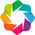

In [12]:
# plot wtih holoviews + datashader - bokeh with map background
import holoviews as hv
import geoviews as gv
import datashader as ds
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr
from datashader.colors import colormap_select, Greys9
from holoviews.streams import RangeXY
from holoviews.operation.datashader import datashade, dynspread, rasterize
from bokeh.io import push_notebook, show, output_notebook
output_notebook()
hv.extension('bokeh')

%opts Overlay [width=800 height=600 toolbar='above' xaxis=None yaxis=None]
%opts QuadMesh [tools=['hover'] colorbar=True] (alpha=0 hover_alpha=0.2)

T = 0.05
PX = 1

def plot_map(data, label, agg_data, agg_name, cmap):
    url="http://server.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{Z}/{Y}/{X}.png"
    geomap = gv.WMTS(url)
    points = hv.Points(gv.Dataset(data, kdims=['x', 'y'], vdims=[agg_name]))
    agg = datashade(points, element_type=gv.Image, aggregator=agg_data, cmap=cmap)
    zip_codes = dynspread(agg, threshold=T, max_px=PX)
    hover = hv.util.Dynamic(rasterize(points, aggregator=agg_data, width=50, height=25, streams=[RangeXY]), operation=hv.QuadMesh)
    hover = hover.options(cmap=cmap)
    img = geomap * zip_codes * hover
    img = img.relabel(label)
    return img

In [14]:
plot_map(brazil, 'Zip Codes in Brazil', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (geolocation_zip_code_prefix)

In [13]:
# plot wtih datashader - image with black background
import datashader as ds
from datashader import transfer_functions as tf
from functools import partial
from datashader.utils import export_image
from IPython.core.display import HTML, display
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr

background = "black"
cm = partial(colormap_select, reverse=(background!="black"))
export = partial(export_image, background = background, export_path="export")
display(HTML("<style>.container { width:100% !important; }</style>"))
W = 700 

def create_map(data, cmap, data_agg, export_name='img'):
    pad = (data.x.max() - data.x.min())/50
    x_range, y_range = ((data.x.min() - pad, data.x.max() + pad), 
                             (data.y.min() - pad, data.y.max() + pad))
    ratio = (y_range[1] - y_range[0]) / (x_range[1] - x_range[0])

    plot_width  = int(W)
    plot_height = int(plot_width * ratio)
    if ratio > 1.5:
        plot_height = 550
        plot_width = int(plot_height / ratio)
        
    cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)

    agg = cvs.points(data, 'x', 'y', data_agg)
    img = tf.shade(agg, cmap=cmap, how='eq_hist')
    return export(img, export_name)

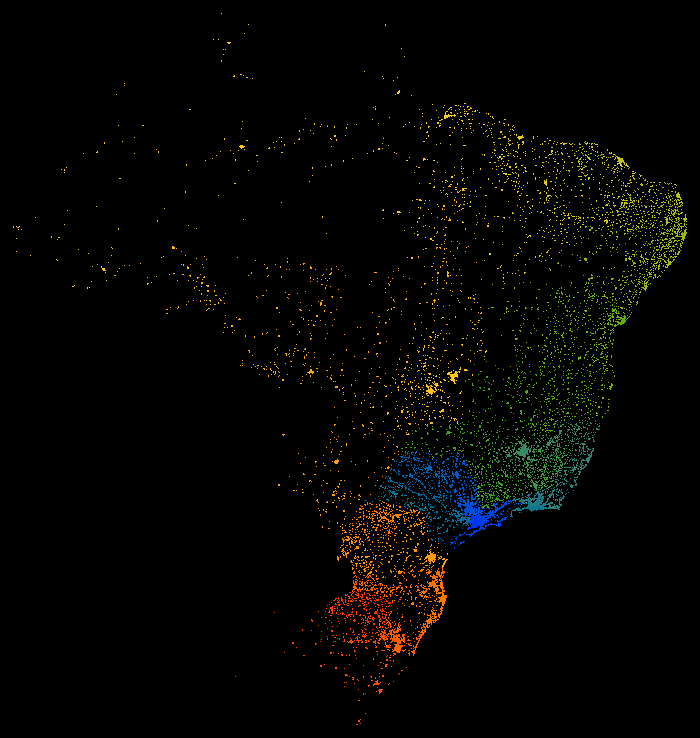

In [15]:
create_map(brazil, rainbow, ds.mean(agg_name),'brazil_zip_codes')

## Zip Codes in States
### Lets look at the state of Sao Paulo (SP) to see how zip code prefixes works in a regional level(most populated state). We see that:

### zip code prefixes in Sao Paulo state ranges from 01001 to 19990
### zip codes starting with 0 are in the Sao Paulo metro region
### zip codes starting with 1 are in the interior of the state

In [17]:
def filter_data(level, name):
    df = geo[geo[level] == name]
    #remove outliers
    df = df[(df.x <= df.x.quantile(0.999)) & (df.x >= df.x.quantile(0.001))]
    df = df[(df.y <= df.y.quantile(0.999)) & (df.y >= df.y.quantile(0.001))]
    return df

In [18]:
sp = filter_data('geolocation_state', 'SP')
agg_name = 'geolocation_zip_code_prefix'
sp[agg_name].describe().to_frame()

,geolocation_zip_code_prefix
count,402651.000000
mean,9030.831782
std,5101.941134
min,1001.000000
25%,4661.000000
50%,8257.000000
75%,13330.000000
max,19990.000000


In [19]:
plot_map(sp, 'Zip Codes in Sao Paulo State', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (geolocation_zip_code_prefix)

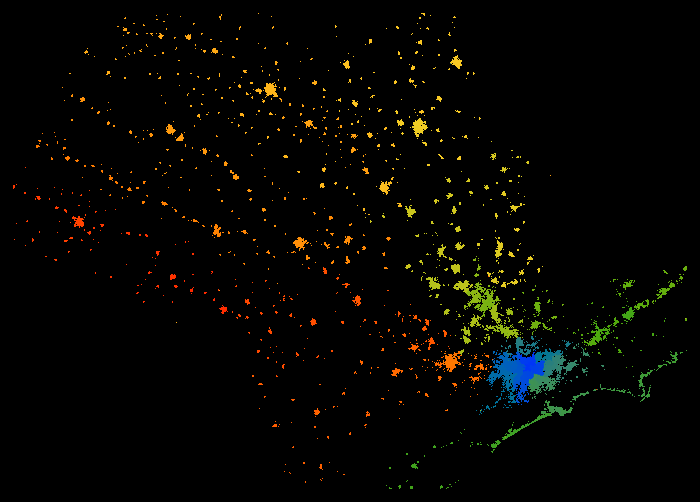

In [20]:
create_map(sp, rainbow, ds.mean(agg_name), 'sp_zip_codes')

### Lets look at the state of Paraiba to see how zip code prefixes works in a regional level(a averagely populated state). We see that:

### zip code prefixes in Paraiba state ranges from 58000 to 58990
### zip codes starting with 5 are in the Pernambuco, Alagoas, Paraiba and Rio De Grande Do Norte states

In [37]:
P = filter_data('geolocation_state', 'PB')
agg_nameP = 'geolocation_zip_code_prefix'
P[agg_nameP].describe().to_frame()

,geolocation_zip_code_prefix
count,5514.000000
mean,58323.229779
std,294.340429
min,58010.000000
25%,58050.250000
50%,58280.000000
75%,58435.500000
max,58995.000000


In [39]:
plot_map(P, 'Zip Codes in PARAIBA State', ds.min(agg_nameP), agg_nameP, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (geolocation_zip_code_prefix)

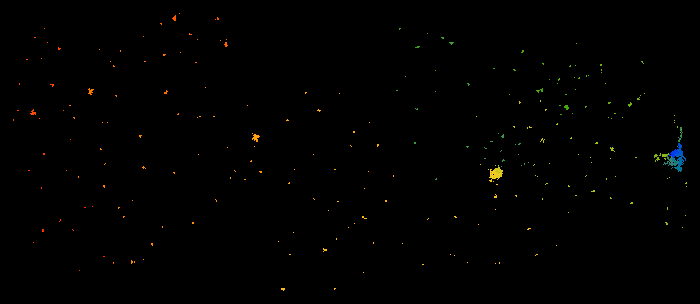

In [40]:
create_map(P, rainbow, ds.mean(agg_nameP), 'P_zip_codes')

## Zip Codes in Large Cities
### Lets look at the city of Rio de Janeiro to see how zip code prefixes works in a city level. We see that:

### zip code prefixes in Rio de Janeiro city ranges from 20000 to 23799
### zip code prefixes are somehow related to neighborhoods or city districts

In [43]:
riodj = filter_data('geolocation_city', 'rio de janeiro')
agg_nameR = 'geolocation_zip_code_prefix'
riodj[agg_nameR].describe().to_frame()

,geolocation_zip_code_prefix
count,61900.000000
mean,21731.750889
std,960.669254
min,20010.000000
25%,20921.000000
50%,21860.000000
75%,22470.000000
max,26520.000000


In [44]:
plot_map(riodj, 'Zip Codes in Rio de Janeiro City', ds.min(agg_nameR), agg_nameR, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (geolocation_zip_code_prefix)

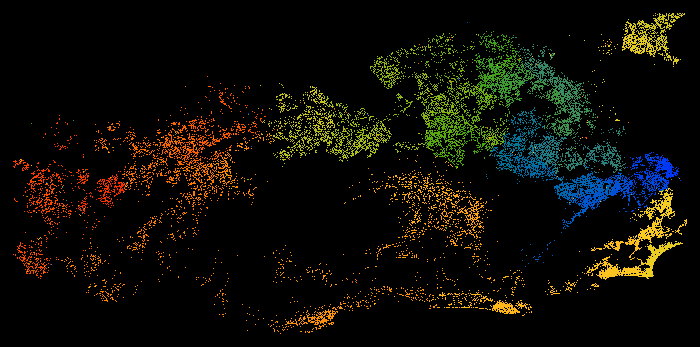

In [45]:
create_map(riodj, rainbow, ds.mean(agg_nameR), 'rio_de_janeiro_zip_codes')

##  Zip Codes in Small Cities
### Lets look at the city of Cuiaba to see how zip code prefixes works in a city level. We see that:

### zip code prefix of Cuiaba city is between 78000 e 78109
### but there are other neighbor cities with the same zip code prefix
### to have more detail and go down to a city level we would probably need more zip code digits (the 4th and 5th digit)

In [46]:
cuiaba = geo[geo['geolocation_city'] == 'cuiaba']
agg_nameC = 'geolocation_zip_code_prefix'
cuiaba[agg_nameC].describe().to_frame()

,geolocation_zip_code_prefix
count,2142.000000
mean,78051.513539
std,23.454898
min,78000.000000
25%,78040.000000
50%,78050.000000
75%,78068.000000
max,78099.000000


In [47]:
plot_map(atibaia, 'Zip Codes in Atibaia', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (geolocation_zip_code_prefix)

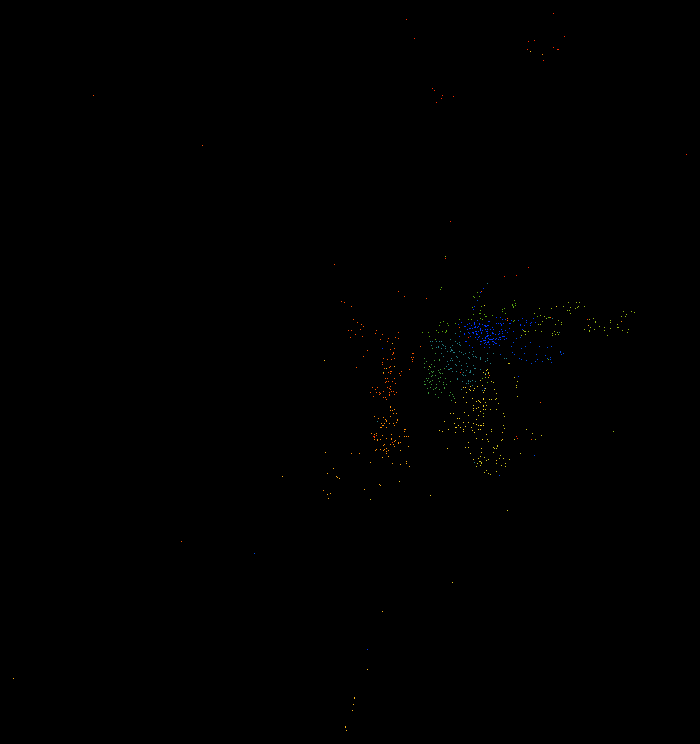

In [48]:
create_map(atibaia, rainbow, ds.mean(agg_name), 'atibaia_zip_codes')

## Abrangence of zip code digits
### What does every digit in the zip code means? Lets zee how it behave, from 1 to 5 digits.

### Zip codes starting with 8 are all from Parana (PA) and Santa Catarina (SC) States

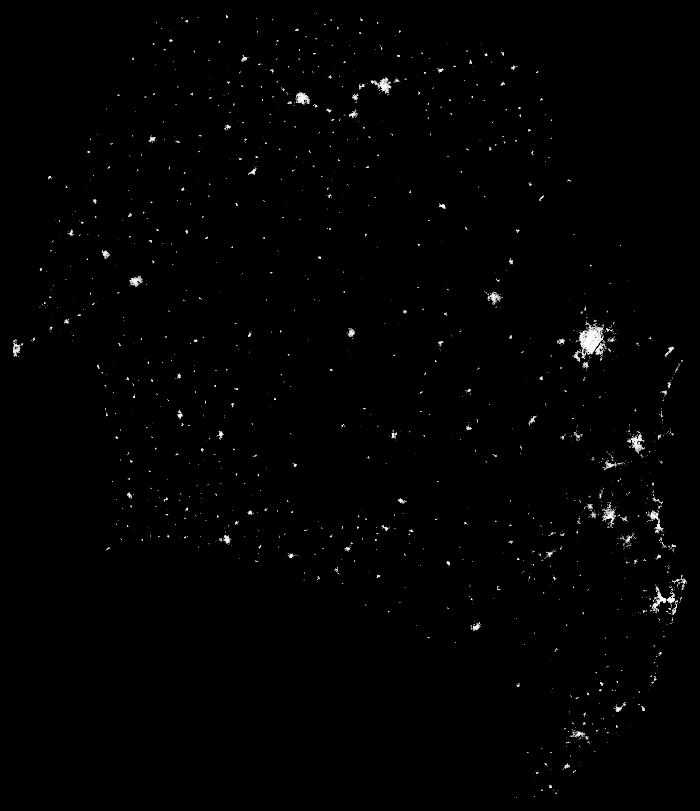

In [53]:
# Zip code: 8
df = filter_data('geolocation_zip_code_prefix_1_digits', 8)
create_map(df, cm(Greys9), ds.count(), 'zip_code_8')

### Zip codes starting with 86 are all within the Parana City but they represent multiple neighborhoods

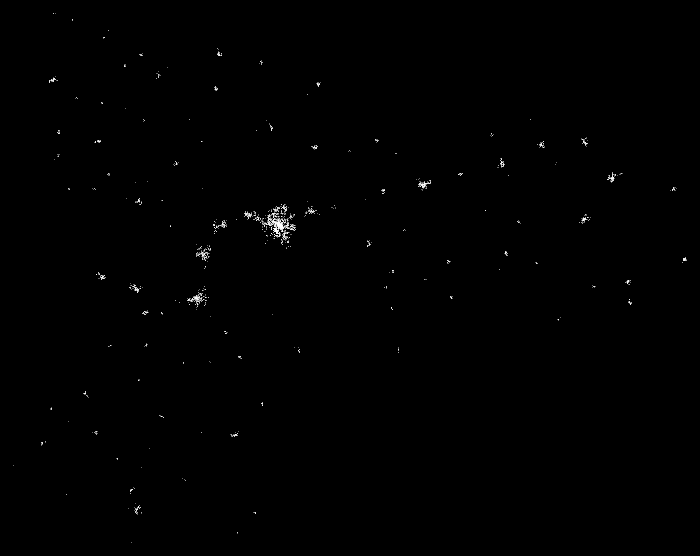

In [54]:
# Zip code: 86
df = filter_data('geolocation_zip_code_prefix_2_digits', 86)
create_map(df, cm(Greys9), ds.count(), 'zip_code_86')

### Zip codes starting with 890 are all within Blumenau, a neighborhood of Riode Janeiro

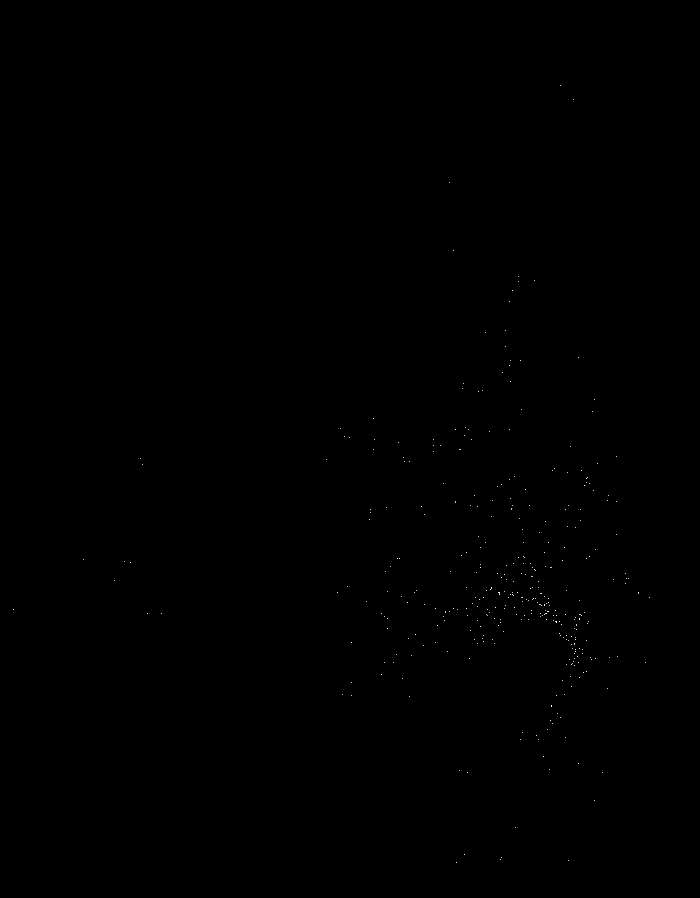

In [61]:
# Zip code: 890
df = filter_data('geolocation_zip_code_prefix_3_digits', 890)
create_map(df, cm(Greys9), ds.count(), 'zip_code_862')

### Zip codes starting with 8901 represent some streets of Blumenau

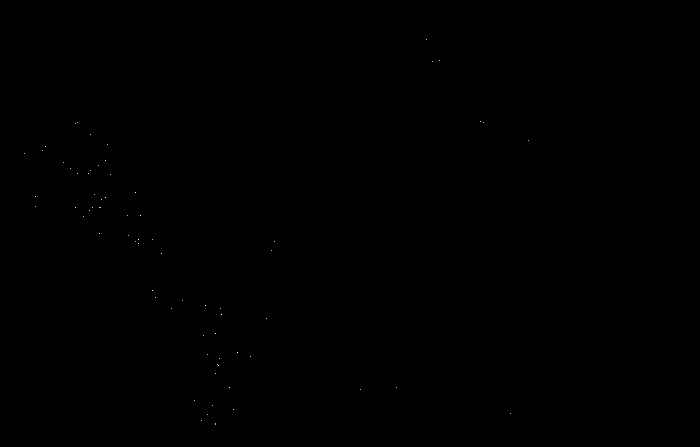

In [67]:
# Zip code: 8901
df = filter_data('geolocation_zip_code_prefix_4_digits', 8901)
create_map(df, cm(Greys9), ds.count(), 'zip_code_8901')

### Zip codes starting with 89010 represent a more strict set of streets of Blumenau

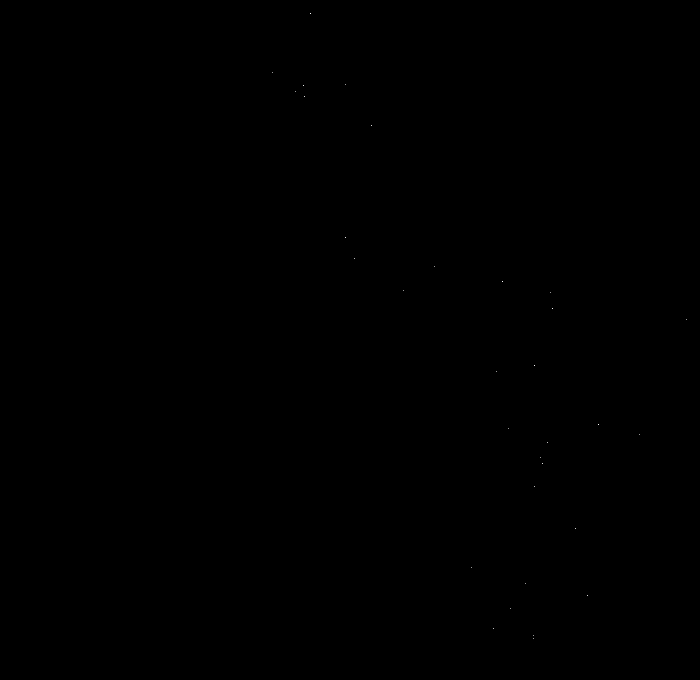

In [68]:
# Zip code: 89010
df = filter_data('geolocation_zip_code_prefix', 89010)
create_map(df, cm(Greys9), ds.count(), 'zip_code_89010')

### So, now it should be clear to you that as we increase the quantity of numbers on zip codes we are selecting subsets of data.

## Where does most revenue comes from?
### Working with 5 digits of zip codes might lead us to very small samples in some areas, so we will work with 3 digits. Plotting the sum of products value grouped by zip code prefix we see that most of the revenue came from the Southeast and South regions of Brazil. It is also possible to see that large cities and capitals, where population is bigger, have larger participation on revenue.

In [69]:
orders_df = pd.read_csv('datasets/olist_orders_dataset.csv')
order_items = pd.read_csv('datasets/olist_order_items_dataset.csv')
order_reviews = pd.read_csv('datasets/olist_order_reviews_dataset.csv')
customer = pd.read_csv('datasets/olist_customers_dataset.csv', dtype={'customer_zip_code_prefix': str})

# getting the first 3 digits of customer zipcode
customer['customer_zip_code_prefix_3_digits'] = customer['customer_zip_code_prefix'].str[0:3]
customer['customer_zip_code_prefix_3_digits'] = customer['customer_zip_code_prefix_3_digits'].astype(int)

brazil_geo = geo.set_index('geolocation_zip_code_prefix_3_digits').copy()

In [70]:
# merging the data
orders = orders_df.merge(order_items, on='order_id')
orders = orders.merge(customer, on='customer_id')
orders = orders.merge(order_reviews, on='order_id')

In [72]:
gp = orders.groupby('customer_zip_code_prefix_3_digits')['price'].sum().to_frame()
revenue = brazil_geo.join(gp)
agg_name = 'revenue'
revenue[agg_name] = revenue.price / 1000

In [73]:
plot_map(revenue, 'Orders Revenue (thousands R$)', ds.mean(agg_name), agg_name, cmap=fire)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (revenue)

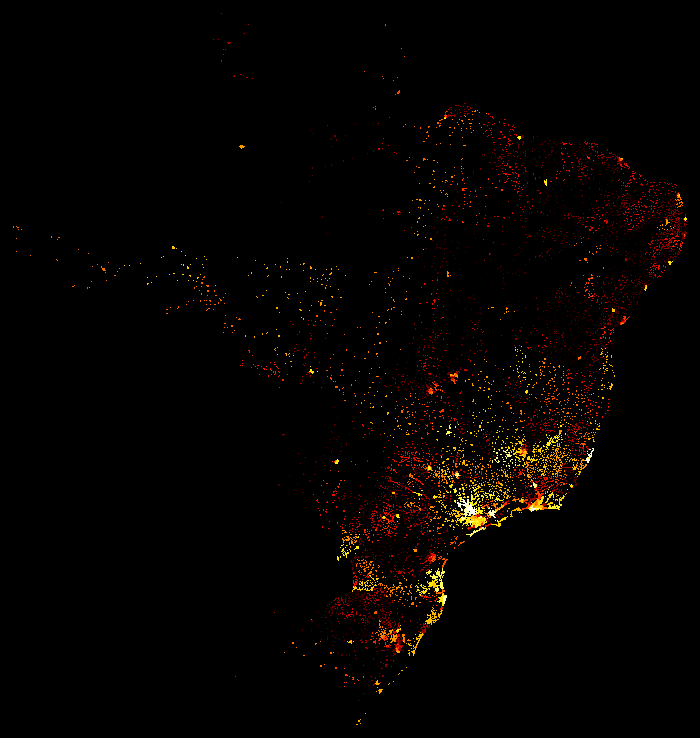

In [81]:
create_map(revenue, fire, ds.mean(agg_name), 'revenue_brazil')

## What is the Average Ticket?
### Here we see something somehow unexpected. Customers of the south and southeast regions of Brazil have lower average ticket, than their peers on north and norteast. This might happen because they have to pay more for freight (let's check that in a moment)

In [84]:
gp = orders.groupby('order_id').agg({'price': 'sum', 'customer_zip_code_prefix_3_digits': 'max'})
gp = gp.groupby('customer_zip_code_prefix_3_digits')['price'].mean().to_frame()
avg_ticket = brazil_geo.join(gp)
agg_name = 'avg_ticket'
avg_ticket[agg_name] = avg_ticket.price

In [89]:
plot_map(avg_ticket, 'Orders Average Ticket (R$)', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (avg_ticket)

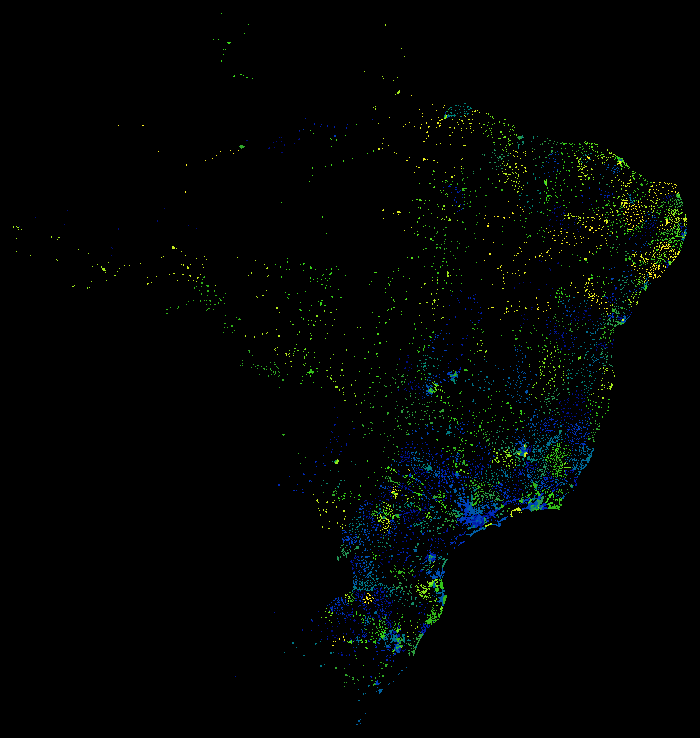

In [90]:
create_map(avg_ticket, bgy, ds.mean('avg_ticket'), 'avg_ticket_brazil')

## Who pays more for transportation?
### We might find a freight ratio by dividing the freight value by the order value. This ratio indicates the percentage of the product price that a person had to pay just to get their order delivered. For example, if a product costs R$50.00 and the freight value was R$10.00, then the freight ratio is 0.2 or 20%. Higher freight ratios are very likely to discourage customers to complete a purchase. Due to logistics costs, we expect to see lower freight ratios in densely populated areas and are higher freight ratios on sparsely poulated regions.

In [95]:
gp = orders.groupby('order_id').agg({'price': 'sum', 'freight_value': 'sum', 'customer_zip_code_prefix_3_digits': 'max'})
agg_name = 'freight_ratio'
gp[agg_name] = gp.freight_value / gp.price
gp = gp.groupby('customer_zip_code_prefix_3_digits')[agg_name].mean().to_frame()
freight_ratio = brazil_geo.join(gp)

In [96]:
plot_map(freight_ratio, 'Orders Average Freight Ratio', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (freight_ratio)

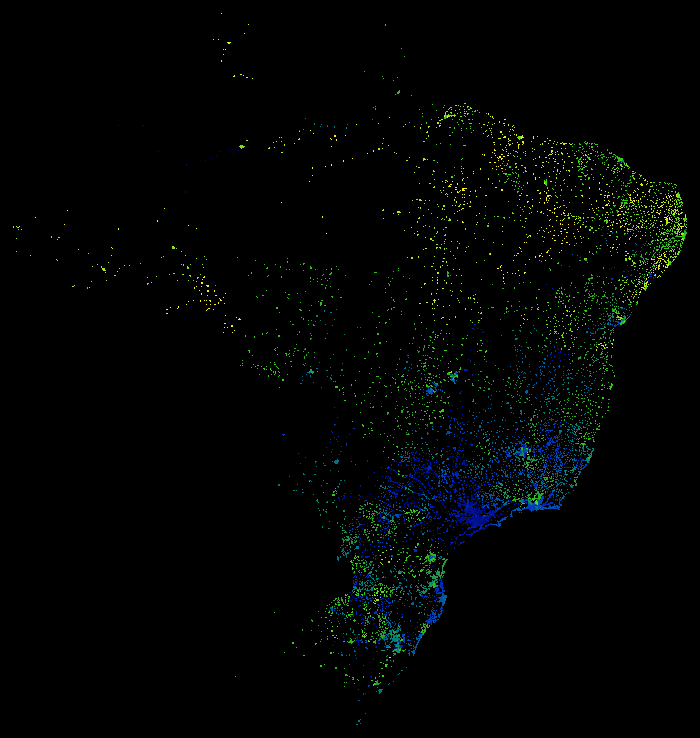

In [97]:
create_map(freight_ratio, bgy, ds.mean('freight_ratio'), 'freight_ratio_brazil')

## Average Delivery Time
### Unfortunately, those who live in the north and northeast of Brazil has to bear with higher freight costs and has to wait longer to receive their purchase.

In [99]:
orders['order_delivered_customer_date'] = pd.to_datetime(orders.order_delivered_customer_date)
orders['order_estimated_delivery_date'] = pd.to_datetime(orders.order_estimated_delivery_date)
orders['order_delivered_carrier_date'] = pd.to_datetime(orders.order_delivered_carrier_date)
orders['actual_delivery_time'] = orders.order_delivered_customer_date - orders.order_delivered_carrier_date
orders['actual_delivery_time'] = orders['actual_delivery_time'].dt.days

In [101]:
gp = orders.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
delivery_time = brazil_geo.join(gp)
agg_name = 'avg_delivery_time'
delivery_time[agg_name] = delivery_time['actual_delivery_time']

In [104]:
plot_map(delivery_time, 'Orders Average Delivery Time (days)', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (avg_delivery_time)

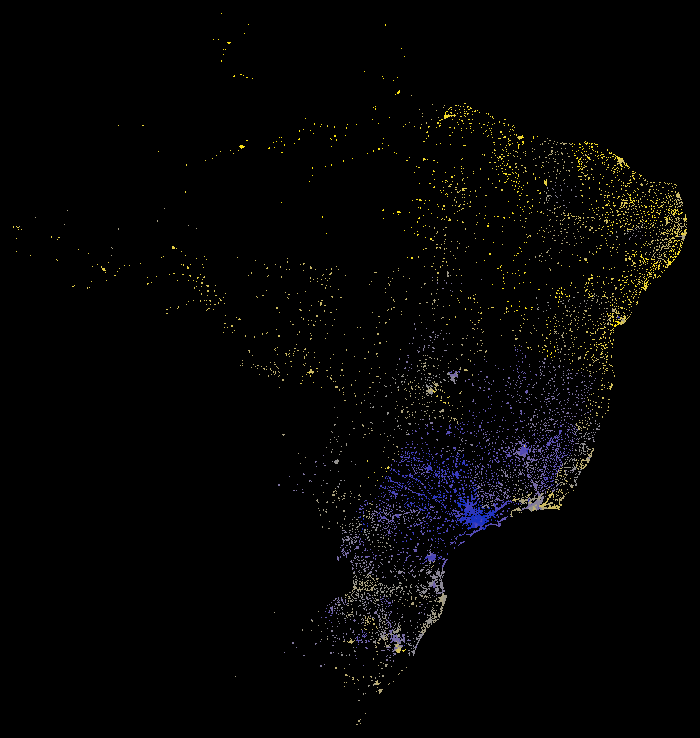

In [105]:
create_map(delivery_time, bjy, ds.mean(agg_name), 'avg_delivery_time_brazil')

### Lets look to delivery times at a state level. We filtered only orders from Minas Gerais state (MG). It is possible to see that larger cities have lower average delivery times than the smaller ones.

In [106]:
pr = filter_data('geolocation_state', 'MG').set_index('geolocation_zip_code_prefix_3_digits')
gp = orders.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
pr_delivery_time = pr.join(gp)
agg_name = 'avg_delivery_time'
pr_delivery_time[agg_name] = pr_delivery_time['actual_delivery_time']

In [107]:
plot_map(pr_delivery_time, 'Orders Average Delivery Time in Minas Gerais State (days)', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (avg_delivery_time)

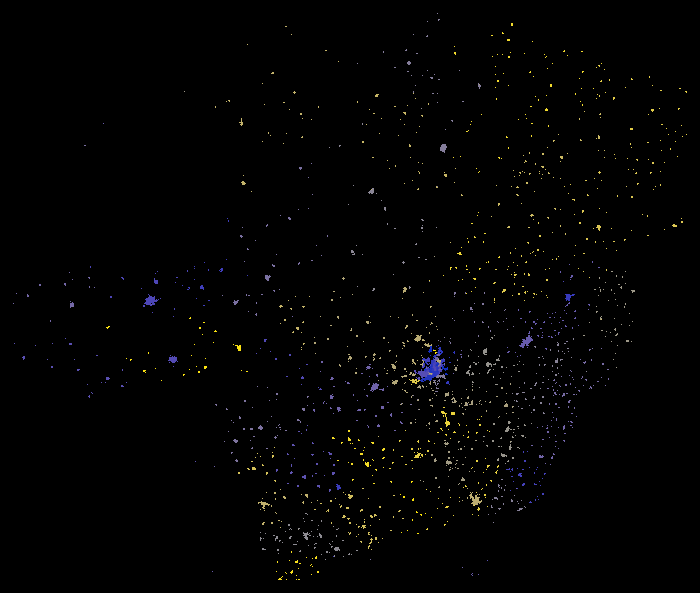

In [108]:
create_map(pr_delivery_time, bjy, ds.mean(agg_name), 'avg_delivery_time_pr')

### Trying a less populated state, Alagoas State (AL)

In [109]:
pr = filter_data('geolocation_state', 'AL').set_index('geolocation_zip_code_prefix_3_digits')
gp = orders.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
pr_delivery_time = pr.join(gp)
agg_name = 'avg_delivery_time'
pr_delivery_time[agg_name] = pr_delivery_time['actual_delivery_time']

In [110]:
plot_map(pr_delivery_time, 'Orders Average Delivery Time in Alagoas State (days)', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (avg_delivery_time)

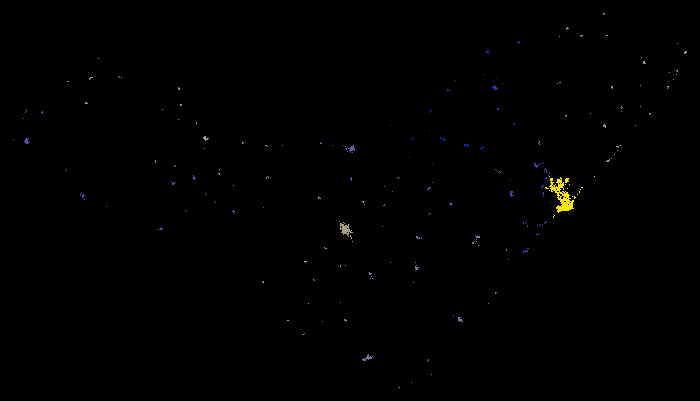

In [111]:
create_map(pr_delivery_time, bjy, ds.mean(agg_name), 'avg_delivery_time_pr')

## Interesting Point About Brazilian Suburbs
### Unlike other countries, in Brazil the richest areas usualy are near downtown while suburbs are know for poverty and high violence rates. Lets explore that in Rio the Janeiro.

### It turns out that if you live in populous states such as Minas Gerais you are likey to receive your order five days earlier than someone who lives in aless populous state such as Alagoas. We see the same pattern in cities, customers near downtown (richer cities) receive their orders faster than those who lives on suburbs(poorer cities). 

## Orders Average Review Score
### Customers of Rio de Janeiro State and Northeast Region are more likely to give low scores on purchases.

In [113]:
gp = orders.groupby('customer_zip_code_prefix_3_digits')['review_score'].mean().to_frame()
score = brazil_geo.join(gp)
agg_name = 'avg_score'
score[agg_name] = score['review_score']

In [114]:
plot_map(score, 'Orders Average Review Score', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (avg_score)

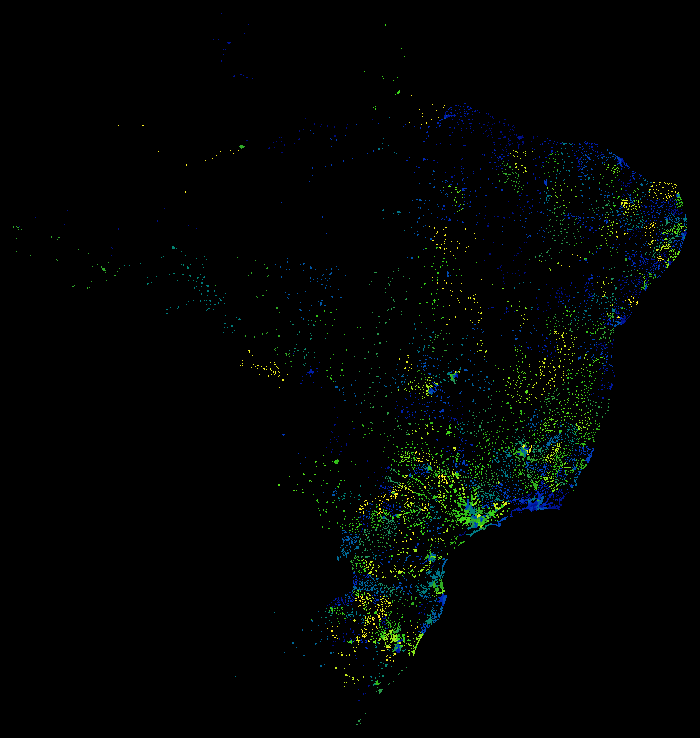

In [115]:
create_map(score, bgy, ds.mean(agg_name), 'avg_review_score_brazil')

## Delayed Orders
### Lets measure the percentage of delayed orders and see how that relate to the score given by customers?

In [116]:
orders['is_delayed'] = orders['order_delivered_customer_date'] > orders['order_estimated_delivery_date'] 
gp = orders.groupby('customer_zip_code_prefix_3_digits').agg({'is_delayed': ['sum', 'count']})
agg_name = 'delayed'
gp[agg_name] = gp['is_delayed']['sum'] / gp['is_delayed']['count']
gp = gp[agg_name]
order_delay = brazil_geo.join(gp)

In [117]:
plot_map(order_delay, 'Orders Delay Percentage in Brazil', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (delayed)

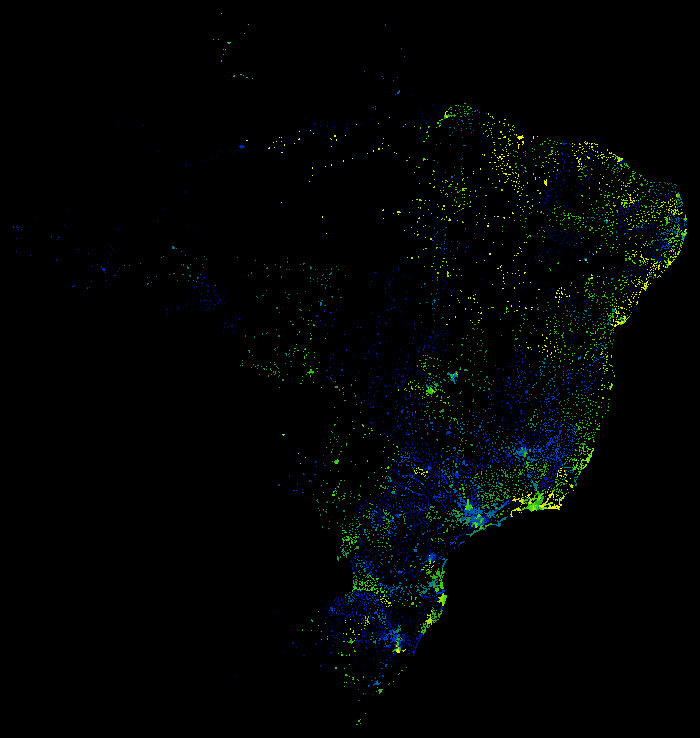

In [118]:
create_map(order_delay, bgy, ds.mean(agg_name), 'brazil_order_delay_percentage')

### People who live in ther northern and northeastern regions have their goods delayed most times compared to those who live in south
### and southeastern regions

## Does customers from small towns buy more items on a single order?
### Lets check the average item quantity per order to see if customers that are further out of large cities buy in bulk.

In [122]:
orders['count'] = 1
gp = orders.groupby(['customer_zip_code_prefix_3_digits','order_id'], as_index=False)['count'].count()
gp = gp.groupby('customer_zip_code_prefix_3_digits')['count'].mean().to_frame()
avg_qty = brazil_geo.join(gp)
agg_name = 'avg_qty'
avg_qty[agg_name] = avg_qty['count']

In [125]:
plot_map(avg_qty, 'Average Item Quantity', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (avg_qty)

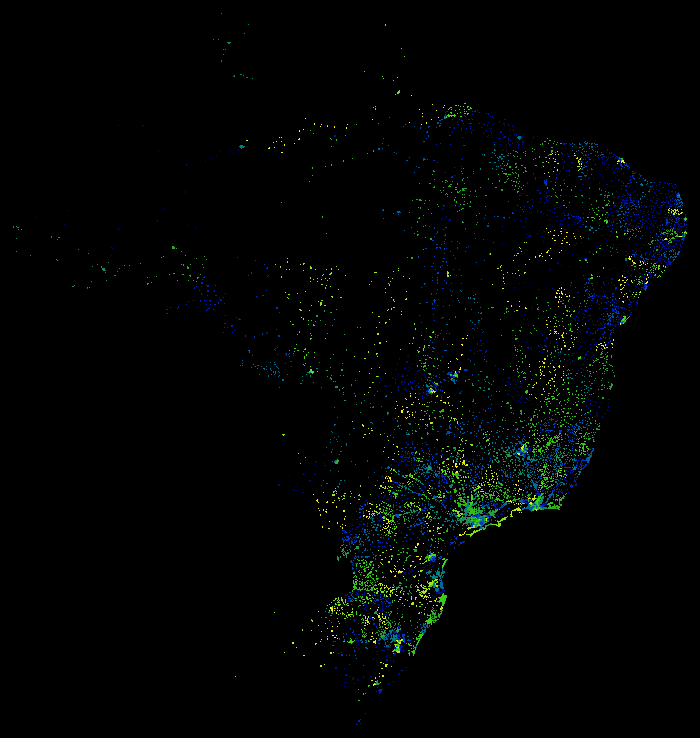

In [126]:
create_map(avg_qty, bgy, ds.mean(agg_name), 'avg_qty_items')

### Apparently that hypothesis is false. Looks like that customers from large cities buy more products per order. But there isn't a clear geographical pattern that would allow us to draw any further conclusion.

### Finding which category of items were sold the most

In [127]:
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [128]:
products_df = pd.read_csv('datasets/olist_products_dataset.csv')
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [130]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [132]:
# merging the data
cat_orders = orders_df.merge(order_items, on='order_id')
cat_orders = cat_orders.merge(products_df, on='product_id')
cat_orders = cat_orders.merge(customer, on='customer_id')
cat_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_zip_code_prefix_3_digits
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,4.0,500.0,19.0,8.0,13.0,7c396fd4830fd04220f754e42b4e5bff,03149,sao paulo,SP,31
1,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1,87285b34884572647811a353c7ac498a,...,4.0,500.0,19.0,8.0,13.0,3a51803cc0d012c3b5dc8b7528cb05f7,03366,sao paulo,SP,33
2,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1,87285b34884572647811a353c7ac498a,...,4.0,500.0,19.0,8.0,13.0,ef0996a1a279c26e7ecbd737be23d235,02290,sao paulo,SP,22
3,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,delivered,2017-10-23 23:26:46,2017-10-25 02:14:11,2017-10-27 16:48:46,2017-11-07 18:04:59,2017-11-13 00:00:00,1,87285b34884572647811a353c7ac498a,...,4.0,500.0,19.0,8.0,13.0,e781fdcc107d13d865fc7698711cc572,88032,florianopolis,SC,880
4,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,595fac2a385ac33a80bd5114aec74eb8,...,1.0,400.0,19.0,13.0,19.0,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,478


In [135]:
#checking the datatypes of each column
cat_orders.dtypes

order_id                              object
customer_id                           object
order_status                          object
order_purchase_timestamp              object
order_approved_at                     object
order_delivered_carrier_date          object
order_delivered_customer_date         object
order_estimated_delivery_date         object
order_item_id                          int64
product_id                            object
seller_id                             object
shipping_limit_date                   object
price                                float64
freight_value                        float64
product_category_name                 object
product_name_lenght                  float64
product_description_lenght           float64
product_photos_qty                   float64
product_weight_g                     float64
product_length_cm                    float64
product_height_cm                    float64
product_width_cm                     float64
customer_u

In [143]:
#checking the number of unique categories
cat_orders['product_category_name'].nunique()

73

In [146]:
#getting the most bought category of product
cat_orders['count'] = 1
cat = cat_orders.groupby(['product_category_name'], as_index=False)['count'].count()
cat

,product_category_name,count
0,agro_industria_e_comercio,212
1,alimentos,510
2,alimentos_bebidas,278
3,artes,209
4,artes_e_artesanato,24
5,artigos_de_festas,43
6,artigos_de_natal,153
7,audio,364
8,automotivo,4235
9,bebes,3065


In [147]:
cat_orders['count'] = 1
cat_gp = cat_orders.groupby(['customer_zip_code_prefix_3_digits','product_category_name'], as_index=False)['count'].count()
cat_gp = cat_gp.groupby('customer_zip_code_prefix_3_digits')['count'].mean().to_frame()
most_bought = brazil_geo.join(cat_gp)
agg_name = 'most_bought'
most_bought[agg_name] = most_bought['count']
most_bought.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_4_digits,x,y,count,most_bought
10,1037,-23.545621,-46.639292,sao paulo,SP,0,1,103,-5.191862e+06,-2.698137e+06,4.970588,4.970588
10,1046,-23.546081,-46.644820,sao paulo,SP,0,1,104,-5.192478e+06,-2.698193e+06,4.970588,4.970588
10,1046,-23.546129,-46.642951,sao paulo,SP,0,1,104,-5.192270e+06,-2.698199e+06,4.970588,4.970588
10,1041,-23.544392,-46.639499,sao paulo,SP,0,1,104,-5.191885e+06,-2.697988e+06,4.970588,4.970588
10,1035,-23.541578,-46.641607,sao paulo,SP,0,1,103,-5.192120e+06,-2.697646e+06,4.970588,4.970588


In [151]:
plot_map(most_bought, 'Most_purchases', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (most_bought)

### Customers that live in the southeastern and south regions purchase items the most